In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

from datetime import date
import hisepy
import numpy as np
import os
import pandas as pd
import re
import scanpy as sc

In [2]:
out_dir = 'output'
if not os.path.isdir(out_dir):
    os.makedirs(out_dir)

In [3]:
out_files = []
update_list = []

## Helper functions

In [4]:
def cache_uuid_path(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    if not os.path.isdir(cache_path):
        hise_res = hisepy.reader.cache_files([uuid])
    filename = os.listdir(cache_path)[0]
    cache_file = '{p}/{f}'.format(p = cache_path, f = filename)
    return cache_file

In [5]:
def read_csv_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_csv(cache_file)
    return res

In [6]:
def read_parquet_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_parquet(cache_file)
    return res

In [7]:
def read_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file)
    return res

In [8]:
def backed_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file, backed = 'r')
    return res

In [9]:
def rm_cache_uuid(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    rm_call = 'rm -r {d}'.format(d = cache_path)
    os.system(rm_call)

In [10]:
def format_cell_type(cell_type):
    cell_type = re.sub('\\+', 'pos', cell_type)
    cell_type = re.sub('-', 'neg', cell_type)
    cell_type = re.sub(' ', '_', cell_type)
    return cell_type

In [11]:
def filename_cell_type(filename):
    cell_type = re.sub('.+L3_','',filename)
    cell_type = re.sub('_2024.+','',cell_type)
    cell_type = re.sub('_', ' ', cell_type)
    cell_type = re.sub('pos','+', cell_type)
    cell_type = re.sub('neg','-', cell_type)
    return cell_type

In [12]:
def add_labels(adata, labels):
    obs = adata.obs
    obs = obs.reset_index(drop = True)
    obs = obs.merge(labels, on = 'barcodes', how = 'left')
    obs = obs.set_index('barcodes', drop = False)
    adata.obs = obs
    return adata

In [13]:
def propagate_hierarchy(
    adata,
    hierarchy_df,
    from_level = 'AIFI_L3',
    to_levels = ['AIFI_L2', 'AIFI_L1'],
    keep_original = True,
    original_prefix = 'predicted_'
):
    obs = adata.obs
    
    for to_level in to_levels:
        prop_df = hierarchy_df[[from_level, to_level]]
        prop_df = prop_df.drop_duplicates()
        
        if keep_original:
            obs = obs.rename({to_level: original_prefix + to_level}, axis = 1)
        else:
            obs = obs.drop(to_level, axis = 1)

        obs[from_level] = obs[from_level].astype(str)
        obs = obs.merge(prop_df, on = from_level, how = 'left')
        obs[from_level] = obs[from_level].astype('category')
        obs[to_level] = obs[to_level].astype('category')

    obs = obs.set_index('barcodes', drop = False)
    adata.obs = obs

    return adata

In [14]:
def element_id(n = 3):
    import periodictable
    from random import randrange
    rand_el = []
    for i in range(n):
        el = randrange(0,118)
        rand_el.append(periodictable.elements[el].name)
    rand_str = '-'.join(rand_el)
    return rand_str

## Cluster selection functions

In [15]:
def marker_frac_df(adata, markers, clusters = 'louvain_2'):
    gene_cl_frac = sc.pl.dotplot(
        adata, 
        groupby = clusters,
        var_names = markers,
        return_fig = True
    ).dot_size_df
    return gene_cl_frac

def select_clusters_above_gene_frac(adata, gene, cutoff, clusters = 'louvain_2'):
    gene_cl_frac = marker_frac_df(adata, gene, clusters)
    select_cl = gene_cl_frac.index[gene_cl_frac[gene] > cutoff].tolist()

    return select_cl

def select_clusters_below_gene_frac(adata, gene, cutoff, clusters = 'louvain_2'):
    gene_cl_frac = marker_frac_df(adata, gene, clusters)
    select_cl = gene_cl_frac.index[gene_cl_frac[gene] < cutoff].tolist()

    return select_cl

In [16]:
def extract_cl(adata, gene, direction, cutoff, clusters):
    if direction == 'above':
        sel_cl = select_clusters_above_gene_frac(
            adata, gene, cutoff, clusters
        )
    else:
        sel_cl = select_clusters_below_gene_frac(
            adata, gene, cutoff, clusters
        )

    sel_idx = adata.obs[clusters].isin(sel_cl)
    n_extracted = sum(sel_idx)
    
    sel_adata = adata[sel_idx]
    
    return sel_adata, n_extracted

In [17]:
def remove_cl(adata, gene, direction, cutoff, clusters):
    if direction == 'above':
        sel_cl = select_clusters_above_gene_frac(
            adata, gene, cutoff, clusters
        )
    else:
        sel_cl = select_clusters_below_gene_frac(
            adata, gene, cutoff, clusters
        )

    remove_idx = adata.obs[clusters].isin(sel_cl)
    n_removed = sum(remove_idx)
    keep_idx = [not x for x in remove_idx]

    adata = adata[keep_idx]
    
    return adata, n_removed

## Processing function

In [18]:
def process_adata(adata, resolution = 2):
    
    # Keep a copy of the raw data
    adata = adata.raw.to_adata()
    adata.raw = adata

    print('Normalizing', end = "; ")
    # Normalize and log transform
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)

    print('Finding HVGs', end = "; ")
    # Restrict downstream steps to variable genes
    sc.pp.highly_variable_genes(adata)
    adata = adata[:, adata.var_names[adata.var['highly_variable']]].copy()

    print('Scaling', end = "; ")
    # Scale variable genes
    sc.pp.scale(adata)

    print('PCA', end = "; ")
    # Run PCA
    sc.tl.pca(adata, svd_solver = 'arpack')
    
    print('Neighbors', end = "; ")
    # Find nearest neighbors
    sc.pp.neighbors(
        adata, 
        n_neighbors = 50,
        n_pcs = 30
    )

    print('Leiden', end = "; ")
    # Find clusters
    sc.tl.leiden(
        adata, 
        resolution = resolution, 
        key_added = 'leiden_{r}'.format(r = resolution),
        n_iterations = 2
    )

    print('UMAP', end = "; ")
    # Run UMAP
    sc.tl.umap(adata, min_dist = 0.05)
    
    print('Renormalizing')
    adata = adata.raw.to_adata()
    adata.raw = adata

    # Normalize and log transform
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)
    
    return adata

## Markers for dotplots

In [19]:
broad_markers = [
    'CD3D', # T cells
    'CD3E', # T cells/NK
    'FCN1', # Monocytes/Myeloid
    'HBB', # Erythrocytes
    'MS4A1', # B cells
    'CD79A', # B cells
    'PPBP', # Platelets
    'IFI44L' # ISG-high
]

In [20]:
class_markers = [
    'AXL',     # ASDCs
    'C1orf54',
    'CCL3',    # IL1B+ Monocytes
    'CD14',    # CD14+ Monocytes and cDC2s
    'CD1C',    # cDC2
    'CD74',
    'CDKN1C',
    'CLEC9A',
    'CST3',
    'FCER1A',  # cDC2
    'FCGR3A',  # CD16+ Monocytes
    'HLA-DRA', # CD16+ Monocytes; DCs
    'IFI44L',  # ISG+ cells
    'IL1B',
    'IRF4',    # pDC
    'IRF8',    # pDC
    'ISG15',
    'LST1',
    'MX1',
    'NFKBIA',   # IL1B+ Monocytes
    'S100A9',
    'VCAN'
]

## Read cell type hierarchy

In [21]:
hierarchy_uuid = '1a44252c-8cab-4c8f-92c9-d8f3af633790'
hierarchy_df = read_csv_uuid(hierarchy_uuid)

## Identify files for use in HISE

In [22]:
search_id = 'krypton-erbium-lutetium'

Retrieve files stored in our HISE project store

In [23]:
ps_df = hisepy.list_files_in_project_store('cohorts')
ps_df = ps_df[['id', 'name']]

Filter for files from the previous notebook using our search_id

In [24]:
search_df = ps_df[ps_df['name'].str.contains(search_id)]
search_df = search_df.sort_values('name')
search_df['AIFI_L3'] = [filename_cell_type(f) for f in search_df['name']]

In [25]:
search_df['AIFI_L3'].tolist()

['ASDC',
 'C1Q+ CD16 monocyte',
 'CD14+ cDC2',
 'Core CD14 monocyte',
 'Core CD16 monocyte',
 'HLA-DRhi cDC2',
 'IL1B+ CD14 monocyte',
 'ISG+ CD14 monocyte',
 'ISG+ CD16 monocyte',
 'ISG+ cDC2',
 'Intermediate monocyte',
 'cDC1',
 'pDC']

# Updated filtering

## Filter ASDC

### Proposed updates

- Remove HBB+, PPBP+, and CD79A+ clusters as doublets

In [26]:
cell_type = 'ASDC'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [27]:
type_uuid

'4b57f229-beae-4a55-8e9c-47d7fa956ba0'

In [28]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [29]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

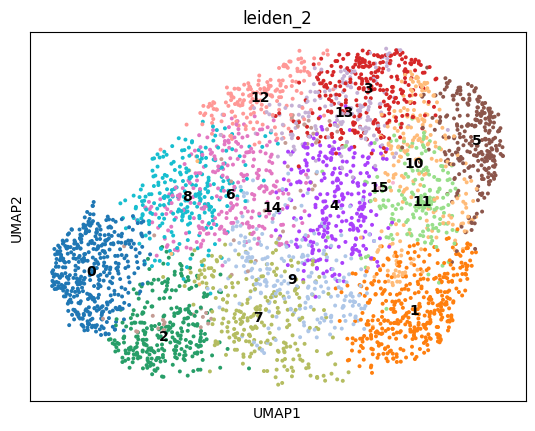

In [30]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

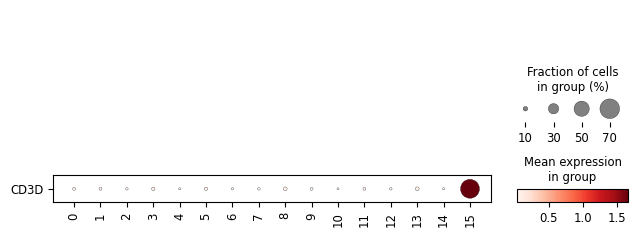

In [31]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD3D'], swap_axes = True)

### CD3D Selection

Filtering

In [32]:
adata, n_removed = remove_cl(
    adata, 'CD3D', 'above', 0.5, 'leiden_2'
)
n_removed

3

Reason

In [33]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['T cell doublet']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [34]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)
/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)


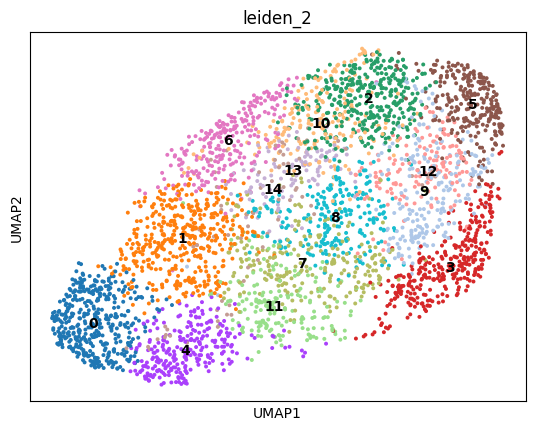

In [35]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [36]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter Core CD14 monocyte

### Proposed updates

- Iteratively cluster FCER1A cluster (16) to delineate CD14+ cDC2 cells
- Reassign FCGR3A-high cluster (21) as mislabeled

In [37]:
cell_type = 'Core CD14 monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [38]:
type_uuid

'0472a980-18c7-42ae-9d77-010217366978'

In [39]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [40]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

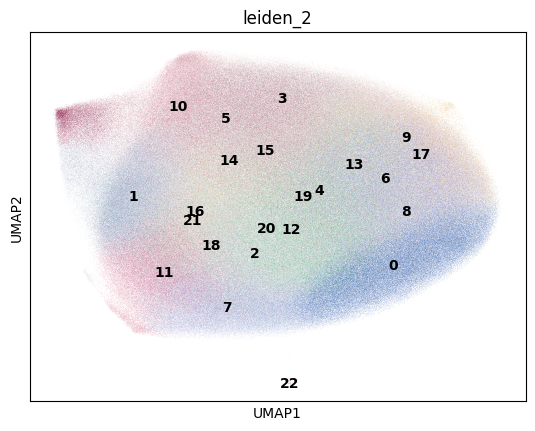

In [41]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

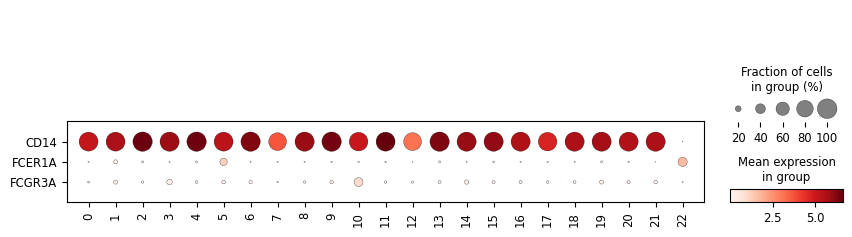

In [42]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD14', 'FCER1A', 'FCGR3A'], swap_axes = True)

### FCER1A Selection

Extraction

In [43]:
fcer1a_adata, n_extracted = extract_cl(
    adata, 'FCER1A', 'above', 0.2, 'leiden_2'
)
n_extracted

103740

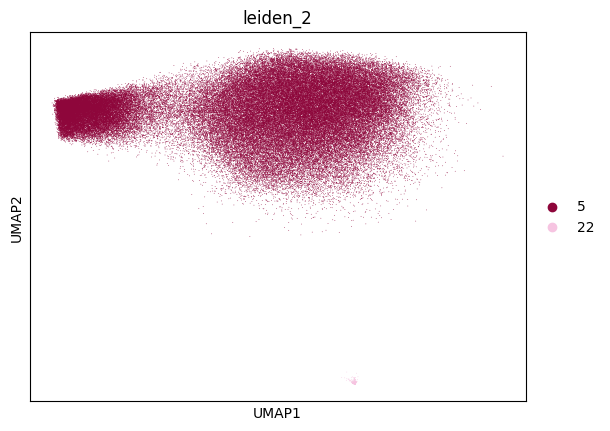

In [44]:
sc.pl.umap(fcer1a_adata, color = 'leiden_2')

Iterative clustering

In [45]:
fcer1a_adata = process_adata(fcer1a_adata, resolution = 2)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


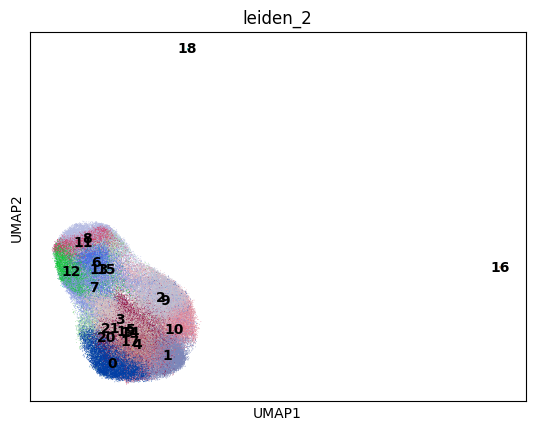

In [46]:
sc.pl.umap(fcer1a_adata, color = 'leiden_2', legend_loc = 'on data')

Marker expression

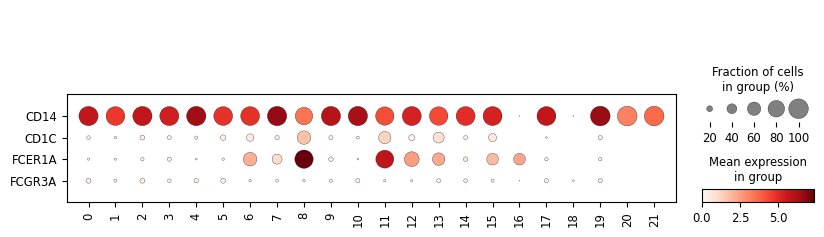

In [47]:
sc.pl.dotplot(fcer1a_adata, groupby = 'leiden_2', var_names = ['CD14', 'CD1C', 'FCER1A', 'FCGR3A'], swap_axes = True)

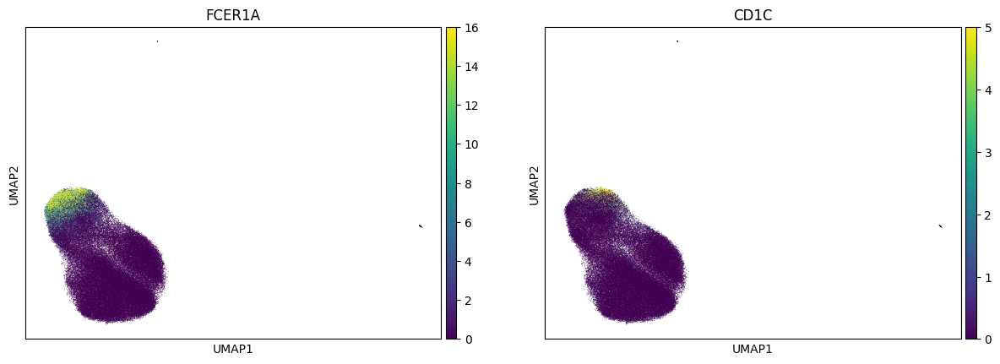

In [48]:
sc.pl.umap(fcer1a_adata, color = ['FCER1A','CD1C'], vmax = 'p99')

### FCER1A Iterative CD1C selection

In [49]:
cd1c_pos_cl = select_clusters_above_gene_frac(
    fcer1a_adata, 'CD1C', 0.5, 'leiden_2'
)
cd1c_pos_cl

['8', '11']

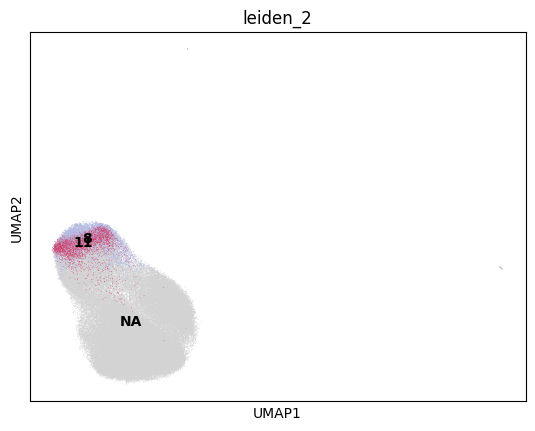

In [50]:
sc.pl.umap(fcer1a_adata, color = 'leiden_2', legend_loc = 'on data', groups = cd1c_pos_cl)

### FCER1A Reassignment

In [51]:
sel_cd1c_bc = fcer1a_adata.obs['barcodes'].loc[fcer1a_adata.obs['leiden_2'].isin(cd1c_pos_cl)]

In [52]:
adata.obs['AIFI_L3'] = adata.obs['AIFI_L3'].cat.add_categories(['CD14+ cDC2'])
adata.obs['AIFI_L3'].loc[adata.obs['barcodes'].isin(sel_cd1c_bc)] = 'CD14+ cDC2'

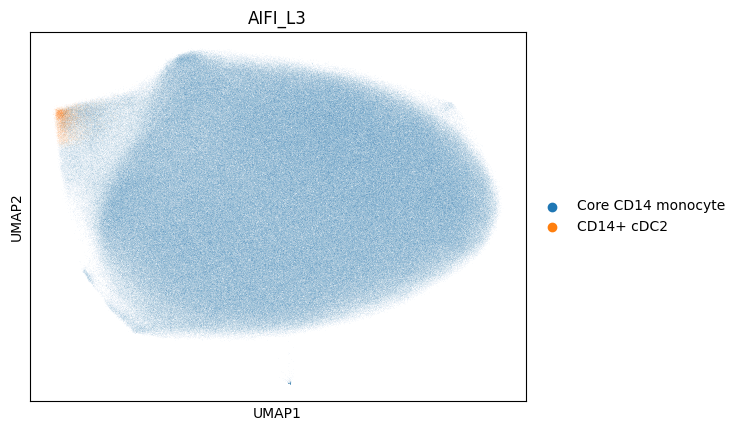

In [53]:
sc.pl.umap(adata, color = 'AIFI_L3')

In [54]:
cd14_cdc2_adata = adata[adata.obs['AIFI_L3'] == 'CD14+ cDC2']
cd14_cdc2_adata.obs['AIFI_L3'] = cd14_cdc2_adata.obs['AIFI_L3'].cat.remove_unused_categories()
cd14_cdc2_adata.obs['origin'] = cell_type

**Reassigned cells will be added to CD14+ cDC2 cells below**

### FCER1A Filtering

In [55]:
adata = adata[adata.obs['AIFI_L3'] != 'CD14+ cDC2']
adata.obs['AIFI_L3'] = adata.obs['AIFI_L3'].cat.remove_unused_categories()

### FCER1A Reason

In [56]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['reassign'],
     'n_total': [total_cells],
     'n_updated': [len(sel_cd1c_bc)],
     'change_to': ['CD14+ cDC2']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [ ]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; 

In [ ]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [ ]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter HLA-DRhi cDC2

### Proposed updates

Re-assign CD14+ cells to CD14+ cDC2

In [ ]:
cell_type = 'HLA-DRhi cDC2'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [ ]:
type_uuid

In [ ]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [ ]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

In [ ]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

In [ ]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD14'], swap_axes = True)

In [ ]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

### CD14 Selection

In [ ]:
hladr_cd14_adata, n_extracted = extract_cl(
    adata, 'CD14', 'above', 0.6, 'leiden_2'
)
n_extracted

In [ ]:
sc.pl.umap(hladr_cd14_adata, color = 'leiden_2')

### CD14 Removal

In [ ]:
adata, n_removed = remove_cl(
    adata, 'CD14', 'above', 0.6, 'leiden_2'
)
n_removed

### CD14 Reason

In [ ]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['reassign'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['CD14+ cDC2']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [ ]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

In [ ]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [ ]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter IL1B+ CD14 monocyte

### Proposed updates

- Remove FCN1-low cluster (23) as non-monocyte
- Remove CD3D+ cluster (21) as T cell doublet
- Remove HBB+ cluster (22) as Erythrocyte doublet

In [ ]:
cell_type = 'IL1B+ CD14 monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [ ]:
type_uuid

In [ ]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [ ]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

In [ ]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

In [ ]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD3D', 'CD3E', 'HBB', 'PPBP','CST3'], swap_axes = True)

In [ ]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

### CD3D Selection

Filtering

In [ ]:
adata, n_removed = remove_cl(
    adata, 'CD3D', 'above', 0.2, 'leiden_2'
)
n_removed

Reason

In [ ]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['T cell doublet']
    }
)
update_list.append(update_df)

### HBB Selection

Filtering

In [ ]:
adata, n_removed = remove_cl(
    adata, 'HBB', 'above', 0.5, 'leiden_2'
)
n_removed

Reason

In [ ]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Erythrocyte doublet']
    }
)
update_list.append(update_df)

### PPBP Selection

Filtering

In [ ]:
adata, n_removed = remove_cl(
    adata, 'PPBP', 'above', 0.5, 'leiden_2'
)
n_removed

Reason

In [ ]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Platelet doublet']
    }
)
update_list.append(update_df)

### Low CST3 Selection

Filtering

In [ ]:
adata, n_removed = remove_cl(
    adata, 'CST3', 'below', 0.5, 'leiden_2'
)
n_removed

Reason

In [ ]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Low quality']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [ ]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

In [ ]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

In [ ]:
sc.pl.umap(adata, color = 'predicted_AIFI_L3', legend_loc = 'on data')

In [ ]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD3D', 'CD3E', 'FCN1', 'HBB', 'PPBP'], swap_axes = True)

### Save filtered cells

In [ ]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter Core CD16 monocyte

### Proposed changes
- Iteratively cluster CD14-high clusters to delineate Intermediate monocytes

In [106]:
cell_type = 'Core CD16 monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [107]:
type_uuid

'38e1c559-85a8-496a-bec1-50eec94e1da4'

In [108]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [109]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

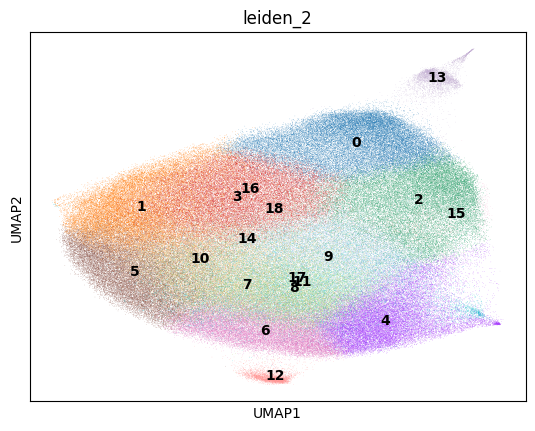

In [110]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

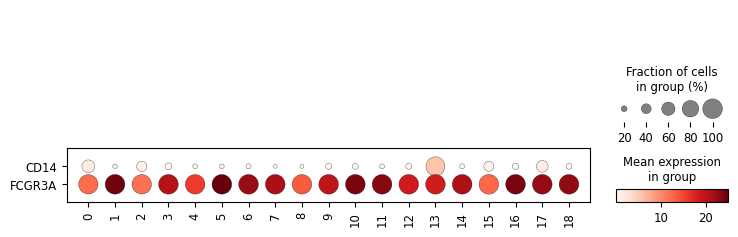

In [111]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD14','FCGR3A'], swap_axes = True)

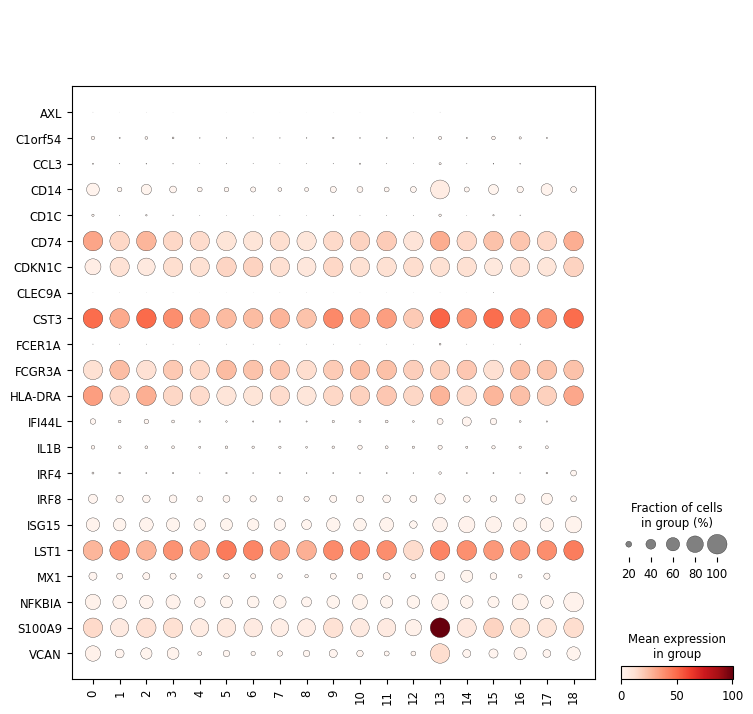

In [112]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### CD14 Doublet Selection

In [113]:
adata, n_removed = remove_cl(
    adata, 'CD14', 'above', 0.8, 'leiden_2'
)
n_removed

4415

In [114]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['CD14/CD16 doublet']
    }
)
update_list.append(update_df)

### CD14 Intermediate Selection

In [115]:
cd14_adata, n_extracted = extract_cl(
    adata, 'CD14', 'above', 0.4, 'leiden_2'
)
n_extracted

59164

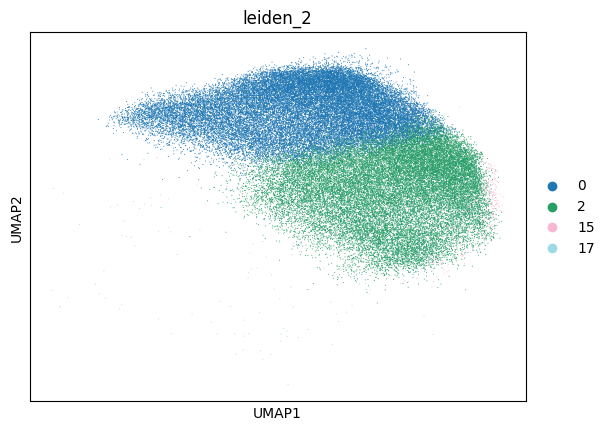

In [116]:
sc.pl.umap(cd14_adata, color = 'leiden_2')

### CD14 Iterative clustering

In [117]:
cd14_adata = process_adata(cd14_adata, resolution = 2)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


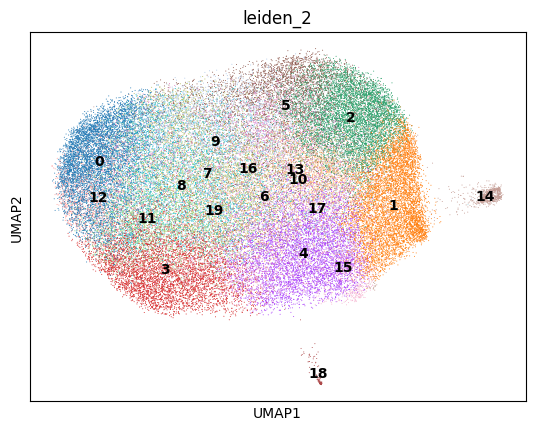

In [118]:
sc.pl.umap(cd14_adata, color = 'leiden_2', legend_loc = 'on data')

### CD14 Marker expression

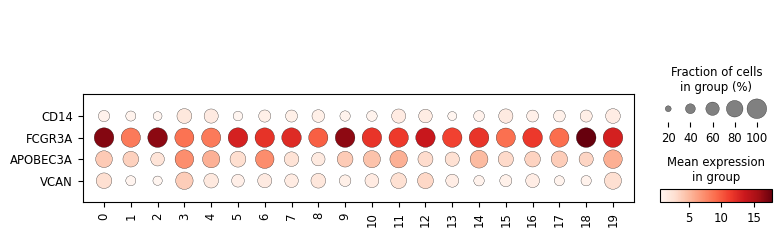

In [119]:
sc.pl.dotplot(cd14_adata, groupby = 'leiden_2', var_names = ['CD14', 'FCGR3A','APOBEC3A','VCAN'], swap_axes = True)

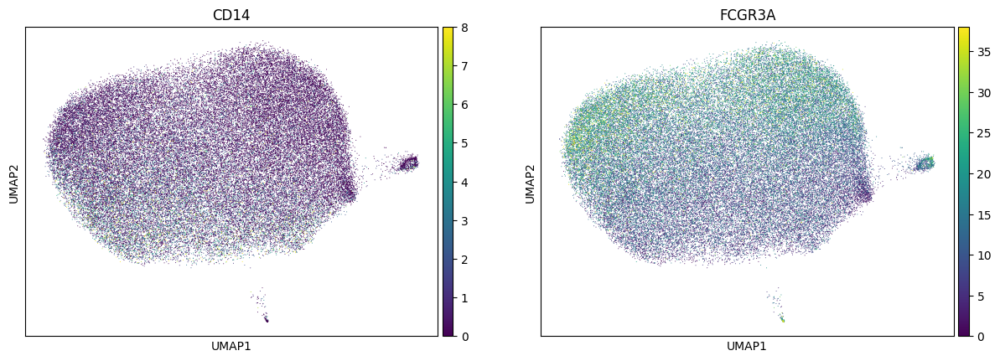

In [120]:
sc.pl.umap(cd14_adata, color = ['CD14','FCGR3A'], vmax = 'p99')

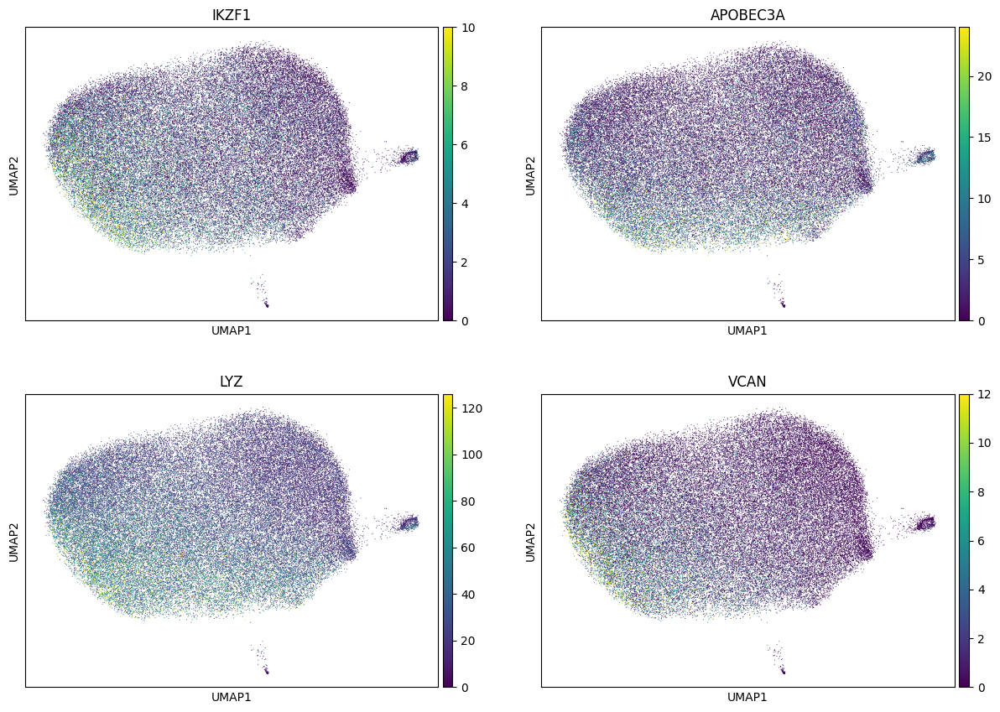

In [121]:
sc.pl.umap(cd14_adata, color = ['IKZF1','APOBEC3A','LYZ','VCAN'], vmax = 'p99', ncols = 2)

### CD14+/CD16+ Iterative selection

In [122]:
dbl_pos_cl = select_clusters_above_gene_frac(
    cd14_adata, 'CD14', 0.6, 'leiden_2'
)
dbl_pos_cl

['3', '4', '11', '12', '15', '19']

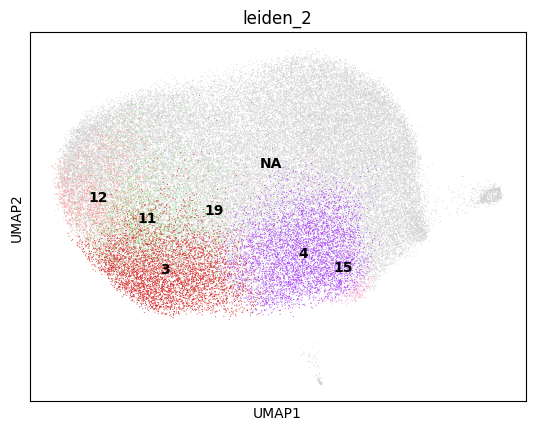

In [123]:
sc.pl.umap(cd14_adata, color = 'leiden_2', legend_loc = 'on data', groups = dbl_pos_cl)

### CD14+/CD16+ Reassignment

In [124]:
sel_cd14_bc = cd14_adata.obs['barcodes'].loc[cd14_adata.obs['leiden_2'].isin(dbl_pos_cl)]

In [125]:
adata.obs['AIFI_L3'] = adata.obs['AIFI_L3'].cat.add_categories(['Intermediate monocyte'])
adata.obs['AIFI_L3'].loc[adata.obs['barcodes'].isin(sel_cd14_bc)] = 'Intermediate monocyte'

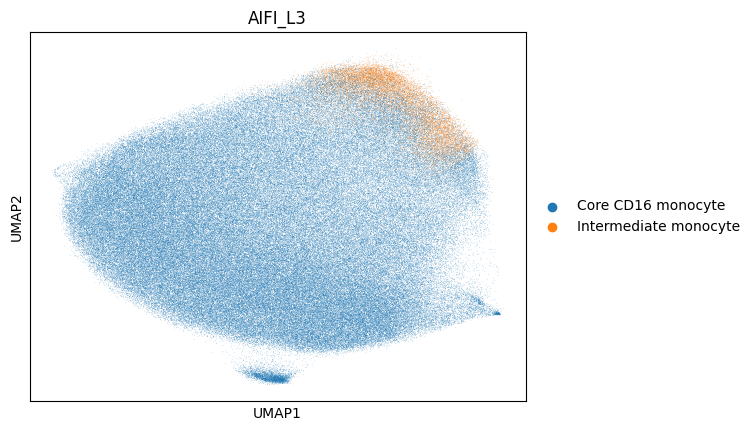

In [126]:
sc.pl.umap(adata, color = 'AIFI_L3')

In [127]:
cd16_intermediate_adata = adata[adata.obs['AIFI_L3'] == 'Intermediate monocyte']
cd16_intermediate_adata.obs['AIFI_L3'] = cd16_intermediate_adata.obs['AIFI_L3'].cat.remove_unused_categories()

In [128]:
cd16_intermediate_adata

AnnData object with n_obs × n_vars = 15141 × 33538
    obs: 'barcodes', 'batch_id', 'cell_name', 'cell_uuid', 'chip_id', 'hto_barcode', 'hto_category', 'n_genes', 'n_mito_umis', 'n_reads', 'n_umis', 'original_barcodes', 'pbmc_sample_id', 'pool_id', 'well_id', 'sample.sampleKitGuid', 'cohort.cohortGuid', 'subject.subjectGuid', 'subject.biologicalSex', 'subject.race', 'subject.ethnicity', 'subject.birthYear', 'sample.visitName', 'sample.drawDate', 'file.id', 'subject.cmv', 'subject.bmi', 'AIFI_L1', 'AIFI_L1_score', 'AIFI_L2', 'AIFI_L2_score', 'predicted_doublet', 'doublet_score', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'leiden_2', 'AIFI_L3', 'AIFI_L3_score', 'predicted_AIFI_L3'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'umap', 'leiden_2_colors

**Reassigned cells will be added to Intermediate monocytes below**

### CD14+/CD16+ Reason

In [129]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['reassign'],
     'n_total': [total_cells],
     'n_updated': [len(sel_cd14_bc)],
     'change_to': ['Intermediate monocyte']
    }
)
update_list.append(update_df)

### Remove Intermediate monocyte

In [130]:
adata = adata[adata.obs['AIFI_L3'] != 'Intermediate monocyte']
adata.obs['AIFI_L3'] = adata.obs['AIFI_L3'].cat.remove_unused_categories()

### Reprocess filtered cells

In [131]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)
/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)


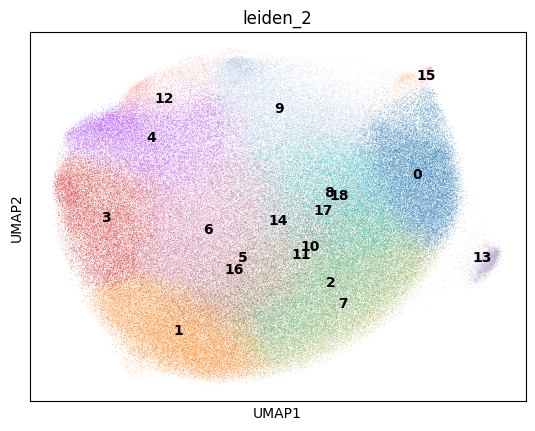

In [132]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

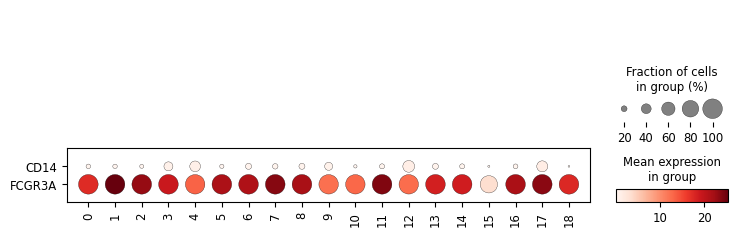

In [133]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD14', 'FCGR3A'], swap_axes = True)

### Save filtered cells

In [134]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter C1Q+ CD16 monocyte

### Proposed updates

- Reassign CD14-pos cluster (19) as Intermediate monocyte
    - Attempted, but did not integrate well
    - Will remove as CD14 Doublets

In [135]:
cell_type = 'C1Q+ CD16 monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [136]:
type_uuid

'fda37ac5-017e-44ce-aad6-d2663541ce2d'

In [137]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [138]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

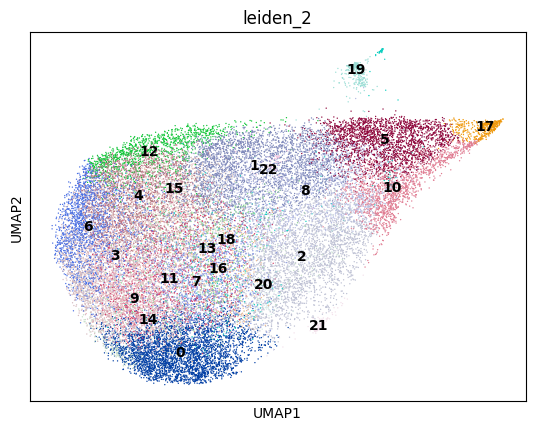

In [139]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

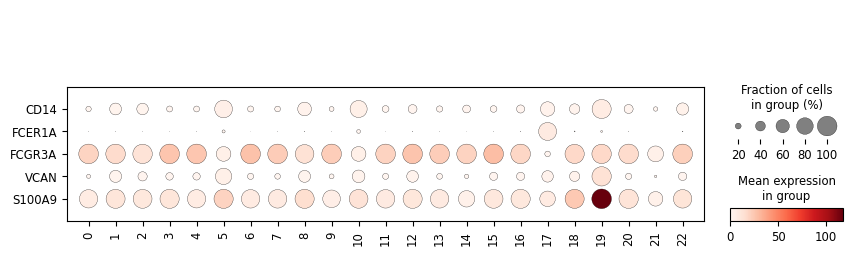

In [140]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD14', 'FCER1A', 'FCGR3A','VCAN', 'S100A9'], swap_axes = True)

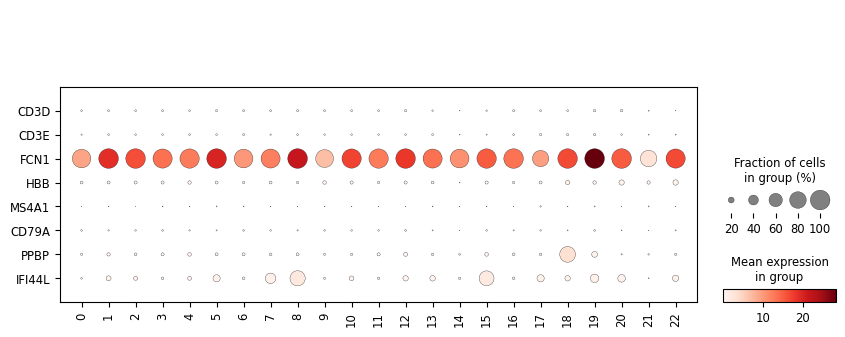

In [141]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

### CD14 Selection

Filtering

In [142]:
adata, n_removed = remove_cl(
    adata, 'CD14', 'above', 0.9, 'leiden_2'
)
n_removed

349

Reason

In [143]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['CD14 doublet']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [144]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)
/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)


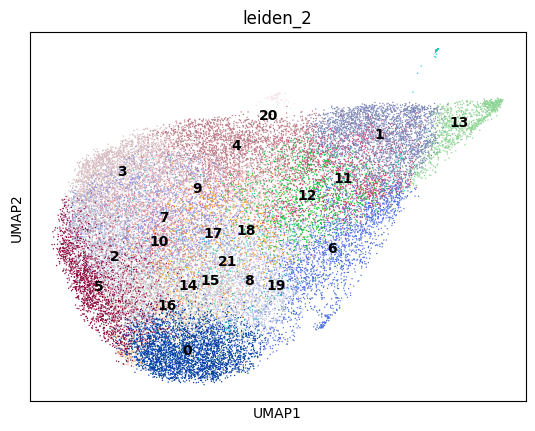

In [145]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [146]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter ISG+ CD16 monocyte

### Proposed updates

- Reassign CD14+ cluster as ISG+ CD14 monocyte

In [147]:
cell_type = 'ISG+ CD16 monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [148]:
type_uuid

'08fa7675-2572-4c10-b62d-f83137d511da'

In [149]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [150]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

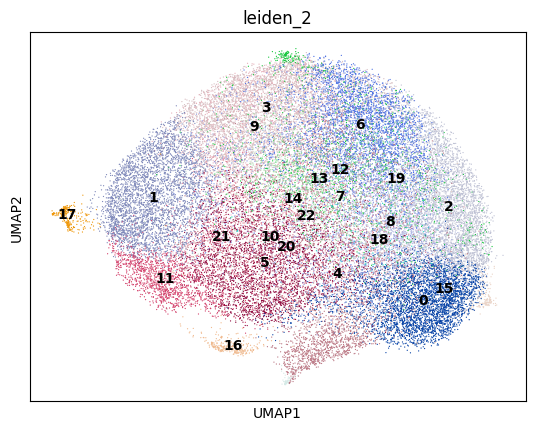

In [151]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

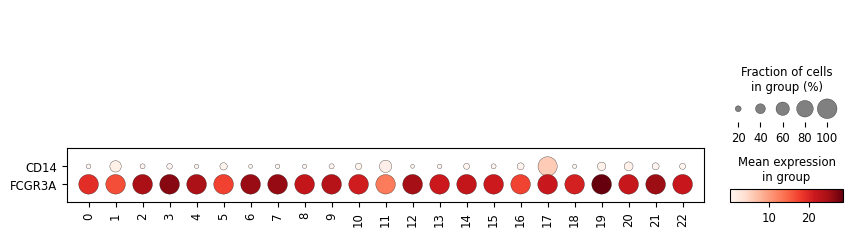

In [152]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD14', 'FCGR3A'], swap_axes = True)

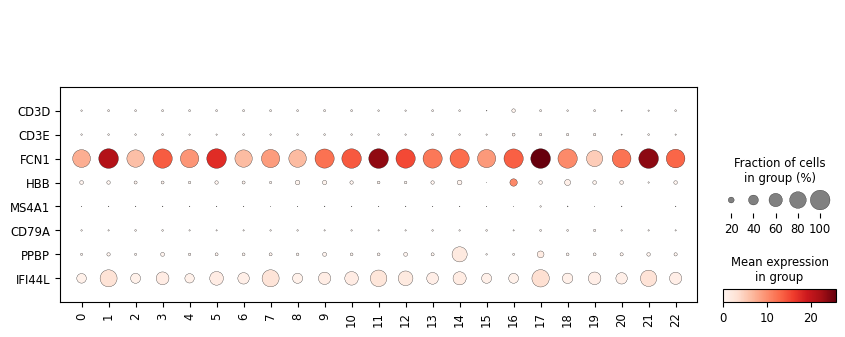

In [153]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

### CD14 selection

Extraction

In [154]:
cd16_isg_cd14_adata, n_extracted = extract_cl(
    adata, 'CD14', 'above', 0.9, 'leiden_2'
)
cd16_isg_cd14_adata.obs['AIFI_L3'] = 'ISG+ CD14 monocyte'
n_extracted

256

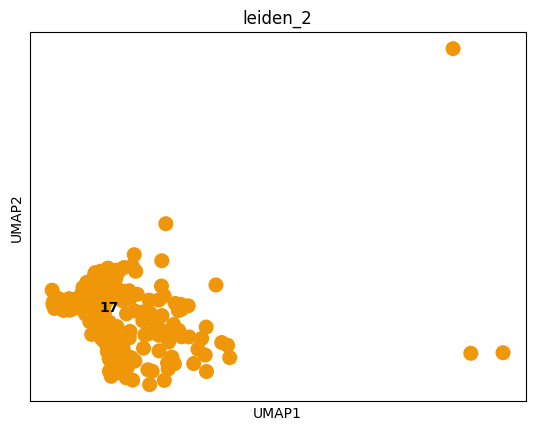

In [155]:
sc.pl.umap(cd16_isg_cd14_adata, color = 'leiden_2', legend_loc = 'on data')

Removal

In [156]:
adata, n_removed = remove_cl(
    adata, 'CD14', 'above', 0.9, 'leiden_2'
)
n_removed

256

Reason

In [157]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['reassign'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['ISG+ CD14 monocyte']
    }
)
update_list.append(update_df)

### Reprocess filtered cells

In [158]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)
/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)


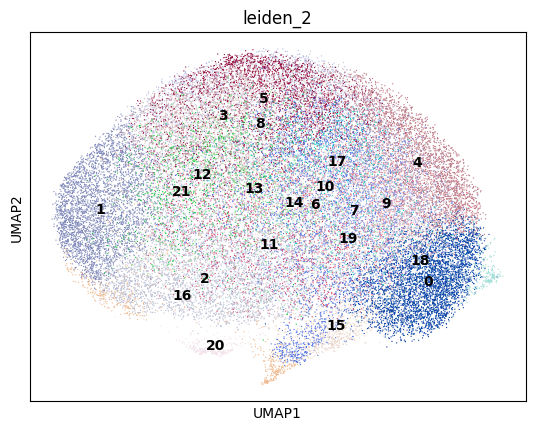

In [159]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [160]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

# Transfer/Integration

## Filter & Integrate ISG+ CD14 monocyte

### Proposed updates

- Remove IFI27+ cells
- Integrate ISG+ CD14 monocytes from ISG+ CD16 cells

In [161]:
cell_type = 'ISG+ CD14 monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [162]:
type_uuid

'5f481c90-f09c-4cd1-b307-a1d2beaecd9b'

In [163]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [164]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Clustering

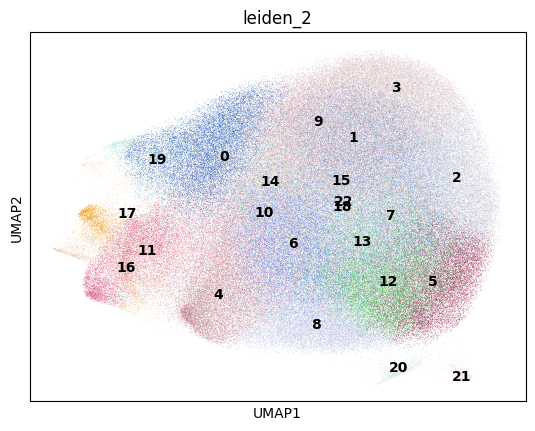

In [165]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

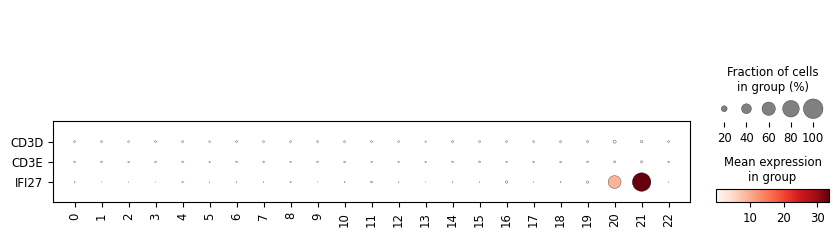

In [166]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD3D', 'CD3E','IFI27'], swap_axes = True)

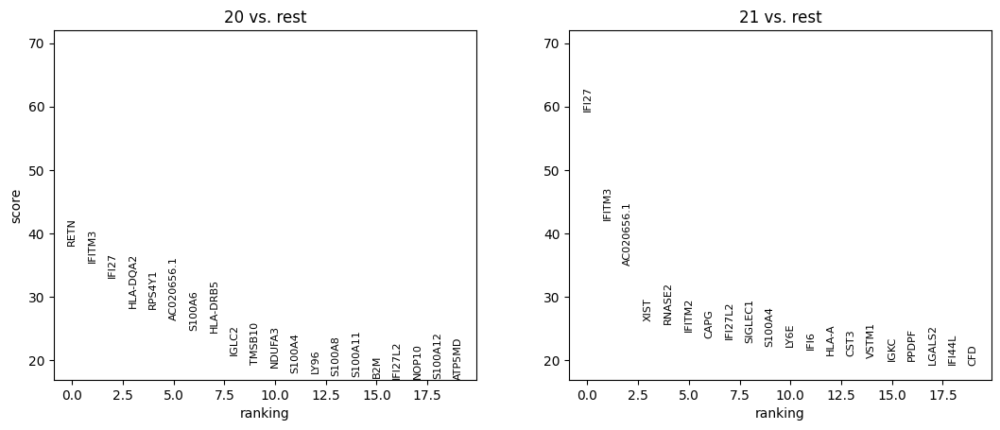

In [167]:
sc.tl.rank_genes_groups(
    adata, 
    groupby = 'leiden_2', 
    groups = ['20','21']
)
sc.pl.rank_genes_groups(adata)

### IFI27 Selection

Filtering

In [168]:
adata, n_removed = remove_cl(
    adata, 'IFI27', 'above', 0.4, 'leiden_2'
)
n_removed

3776

Reason

In [169]:
update_df = pd.DataFrame(
    {'AIFI_L3': [cell_type],
     'update_type': ['remove'],
     'n_total': [total_cells],
     'n_updated': [n_removed],
     'change_to': ['Mislabeled IFI27+']
    }
)
update_list.append(update_df)

### Combine cells from filtered groups

In [170]:
adata = sc.concat([adata, cd16_isg_cd14_adata])

### Reprocess filtered and combined cells

In [171]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)
/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)


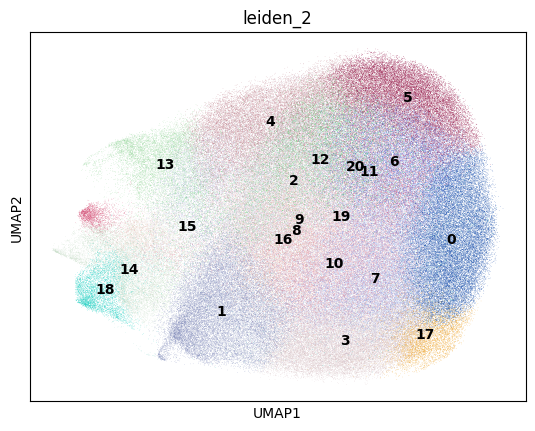

In [172]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

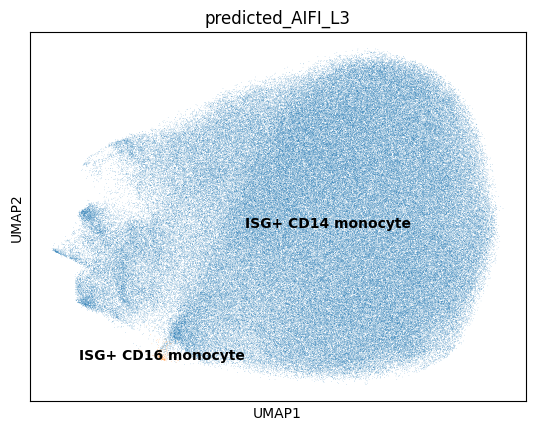

In [173]:
sc.pl.umap(adata, color = 'predicted_AIFI_L3', legend_loc = 'on data')

### Save filtered cells

In [174]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Integrate CD14+ cDC2

### Proposed updates

No proposed changes  
Integrate CD14+ cDC2 cells from other groups

In [175]:
cell_type = 'CD14+ cDC2'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [176]:
type_uuid

'50a62ec9-a6ce-447e-8a65-9cb3125954be'

In [177]:
adata = read_adata_uuid(type_uuid)
total_cells = adata.shape[0]

In [178]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Combine cells from filtered groups

In [179]:
adata = sc.concat([adata, cd14_cdc2_adata, hladr_cd14_adata])

### Reprocess combined cells

In [180]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)
/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)


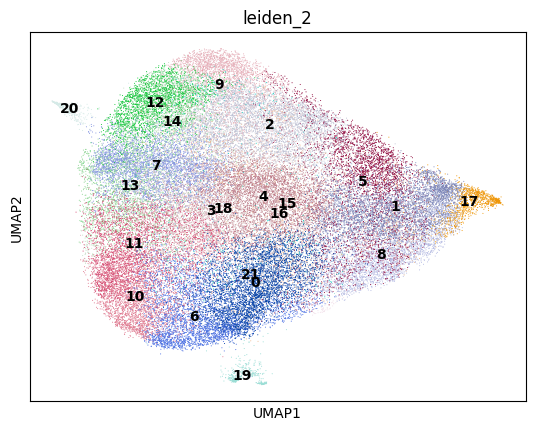

In [181]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

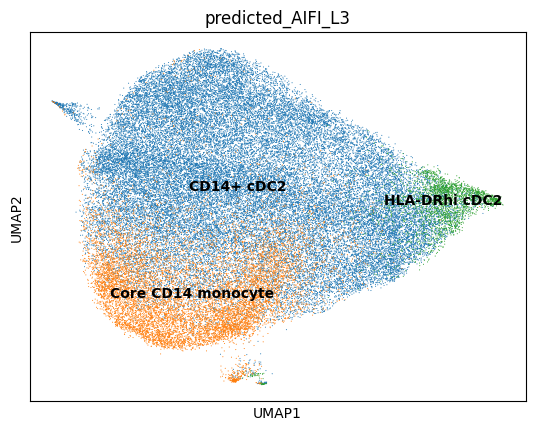

In [182]:
sc.pl.umap(adata, color = 'predicted_AIFI_L3', legend_loc = 'on data')

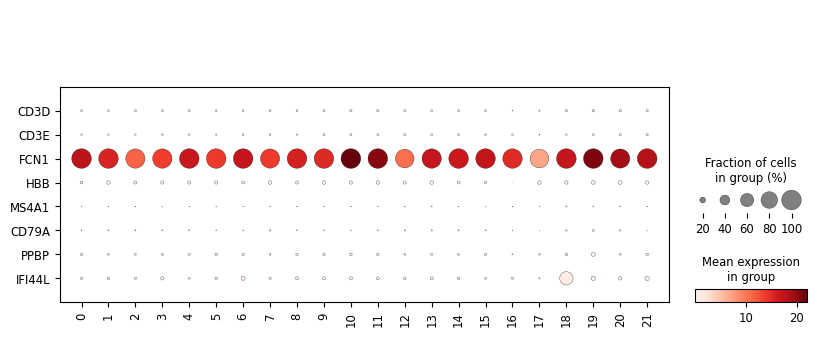

In [183]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

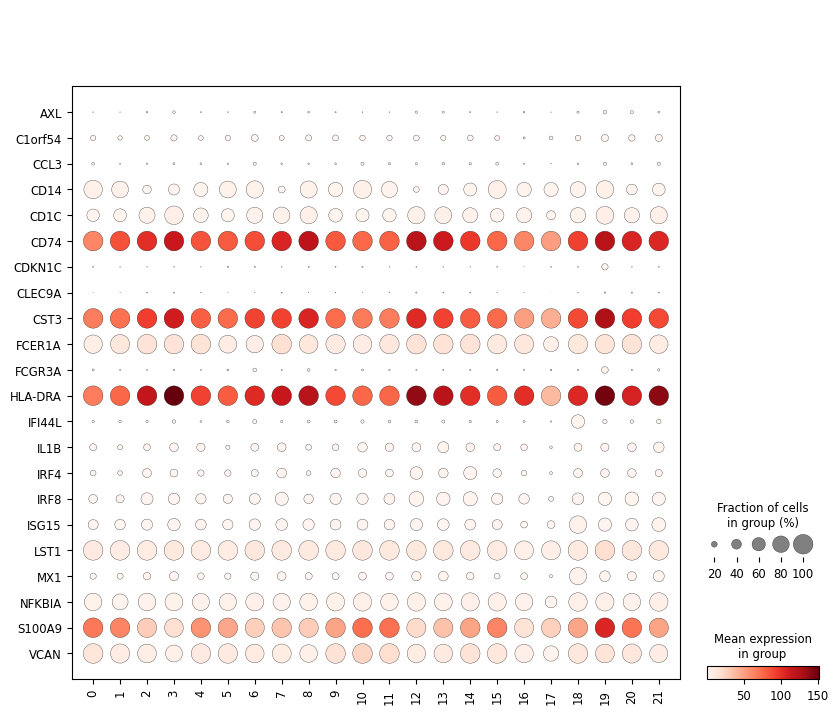

In [184]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Save combined cells

In [185]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Integrate Intermediate monocyte

### Proposed updates

- Integrate intermediate monocytes from other groups

In [186]:
cell_type = 'Intermediate monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [187]:
type_uuid

'9846a639-1fa6-4e06-a3f9-50716959e40b'

In [188]:
adata = read_adata_uuid(type_uuid)
adata.obs['origin'] = cell_type

In [189]:
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']

### Combine cells from filtered groups

In [190]:
adata = sc.concat([adata, cd16_intermediate_adata])

### Reprocess combined cells

In [191]:
adata = process_adata(adata, resolution = 2)
adata = propagate_hierarchy(adata, hierarchy_df)

Normalizing; Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)
/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)


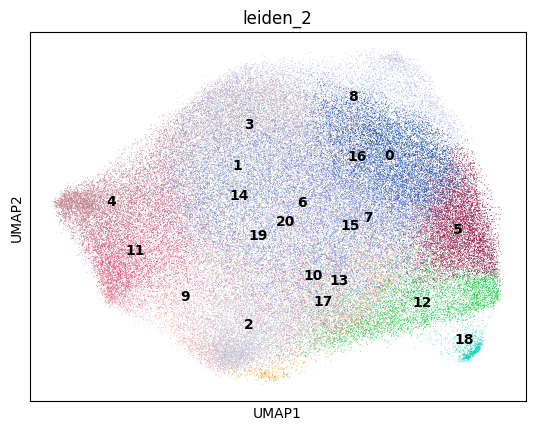

In [192]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

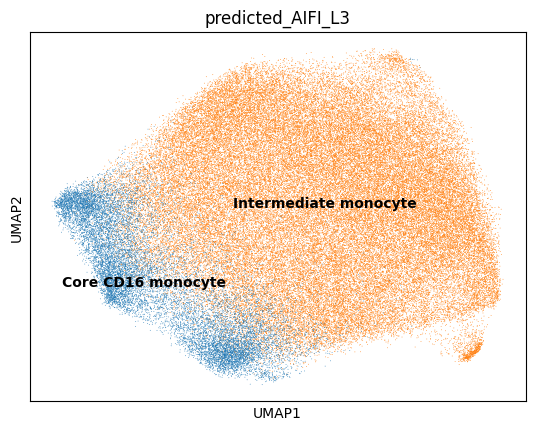

In [193]:
sc.pl.umap(adata, color = 'predicted_AIFI_L3', legend_loc = 'on data')

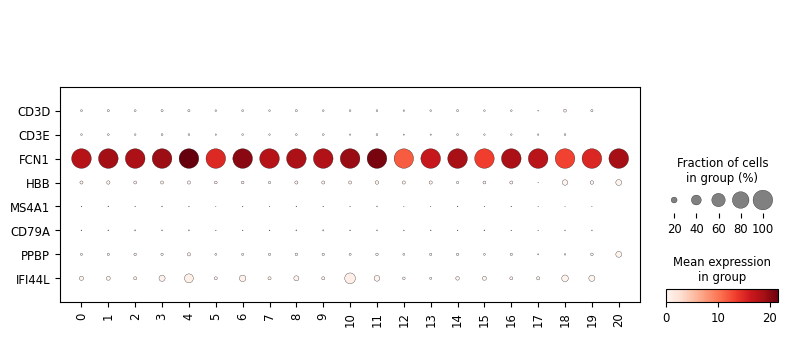

In [194]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

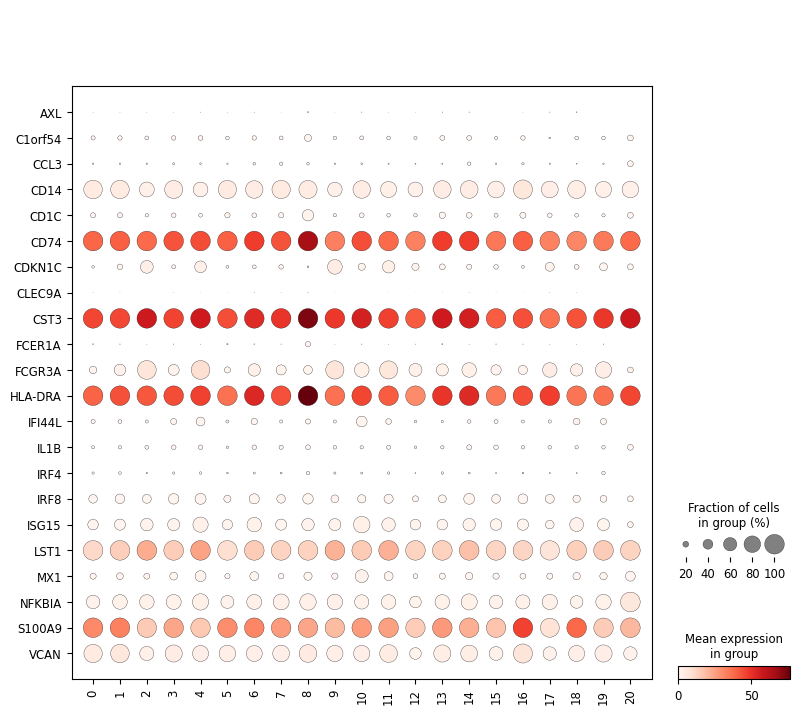

In [195]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Save combined cells

In [196]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

# No Updates

## Pass-through cDC1

In [197]:
cell_type = 'cDC1'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [198]:
type_uuid

'5d8f1403-dc24-4c9d-9aeb-2704e747973d'

In [199]:
adata = read_adata_uuid(type_uuid)
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']
adata = propagate_hierarchy(adata, hierarchy_df)

/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)
/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)


In [200]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Pass-through ISG+ cDC2

### Proposed updates

No proposed changes

In [201]:
cell_type = 'ISG+ cDC2'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [202]:
type_uuid

'6e7a2caf-6144-4500-89c7-f365e871a109'

In [203]:
adata = read_adata_uuid(type_uuid)
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']
adata = propagate_hierarchy(adata, hierarchy_df)

/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)
/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)


In [204]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Pass-through pDC

### Proposed updates

No proposed changes

In [205]:
cell_type = 'pDC'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [206]:
type_uuid

'647fb755-ac85-4501-8d14-675e6011caec'

In [207]:
adata = read_adata_uuid(type_uuid)
adata.obs['predicted_AIFI_L3'] = adata.obs['AIFI_L3']
adata = propagate_hierarchy(adata, hierarchy_df)

/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)
/opt/conda/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:568: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)


In [208]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Assemble update reasoning

In [209]:
update_df = pd.concat(update_list)

In [214]:
update_df

,AIFI_L3,update_type,n_total,n_updated,change_to
0,ASDC,remove,3687,3,T cell doublet
0,Core CD14 monocyte,reassign,1753321,10910,CD14+ cDC2
0,HLA-DRhi cDC2,reassign,53222,2494,CD14+ cDC2
0,IL1B+ CD14 monocyte,remove,22531,45,T cell doublet
0,IL1B+ CD14 monocyte,remove,22531,87,Erythrocyte doublet
0,IL1B+ CD14 monocyte,remove,22531,273,Platelet doublet
0,IL1B+ CD14 monocyte,remove,22531,25,Low quality
0,Core CD16 monocyte,remove,278480,4415,CD14/CD16 doublet
0,Core CD16 monocyte,remove,278480,4415,CD14/CD16 doublet
0,Core CD16 monocyte,reassign,278480,15141,Intermediate monocyte


In [215]:
out_update = 'output/diha_filtered_celltypist_L3_Mono_DC_reasons_{d}.csv'.format(d = date.today())
update_df.to_csv(out_update)

In [212]:
out_files.append(out_update)

## Upload Cell Type data to HISE

Finally, we'll use `hisepy.upload.upload_files()` to send a copy of our output to HISE to use for downstream analysis steps.

In [222]:
study_space_uuid = 'de025812-5e73-4b3c-9c3b-6d0eac412f2a'
title = 'DIHA CellTypist L3 Myeloid Filter {d}'.format(d = date.today())

In [217]:
search_id = element_id()
search_id

'neptunium-cadmium-erbium'

In [218]:
in_files = search_df['id'].tolist()
in_files = in_files + [hierarchy_uuid]

In [219]:
out_files = out_files

In [220]:
out_files

['output/diha_filtered_celltypist_L3_ASDC_2024-04-24.h5ad',
 'output/diha_filtered_celltypist_L3_Core_CD14_monocyte_2024-04-24.h5ad',
 'output/diha_filtered_celltypist_L3_HLAnegDRhi_cDC2_2024-04-24.h5ad',
 'output/diha_filtered_celltypist_L3_IL1Bpos_CD14_monocyte_2024-04-24.h5ad',
 'output/diha_filtered_celltypist_L3_Core_CD16_monocyte_2024-04-24.h5ad',
 'output/diha_filtered_celltypist_L3_C1Qpos_CD16_monocyte_2024-04-24.h5ad',
 'output/diha_filtered_celltypist_L3_ISGpos_CD16_monocyte_2024-04-24.h5ad',
 'output/diha_filtered_celltypist_L3_ISGpos_CD14_monocyte_2024-04-24.h5ad',
 'output/diha_filtered_celltypist_L3_CD14pos_cDC2_2024-04-24.h5ad',
 'output/diha_filtered_celltypist_L3_Intermediate_monocyte_2024-04-24.h5ad',
 'output/diha_filtered_celltypist_L3_cDC1_2024-04-24.h5ad',
 'output/diha_filtered_celltypist_L3_ISGpos_cDC2_2024-04-24.h5ad',
 'output/diha_filtered_celltypist_L3_pDC_2024-04-24.h5ad',
 'output/diha_filtered_celltypist_L3_Mono_DC_reasons_2024-04-24.csv']

In [223]:
hisepy.upload.upload_files(
    files = out_files,
    study_space_id = study_space_uuid,
    title = title,
    input_file_ids = in_files,
    destination = search_id
)

you are trying to upload file_ids... ['output/diha_filtered_celltypist_L3_ASDC_2024-04-24.h5ad', 'output/diha_filtered_celltypist_L3_Core_CD14_monocyte_2024-04-24.h5ad', 'output/diha_filtered_celltypist_L3_HLAnegDRhi_cDC2_2024-04-24.h5ad', 'output/diha_filtered_celltypist_L3_IL1Bpos_CD14_monocyte_2024-04-24.h5ad', 'output/diha_filtered_celltypist_L3_Core_CD16_monocyte_2024-04-24.h5ad', 'output/diha_filtered_celltypist_L3_C1Qpos_CD16_monocyte_2024-04-24.h5ad', 'output/diha_filtered_celltypist_L3_ISGpos_CD16_monocyte_2024-04-24.h5ad', 'output/diha_filtered_celltypist_L3_ISGpos_CD14_monocyte_2024-04-24.h5ad', 'output/diha_filtered_celltypist_L3_CD14pos_cDC2_2024-04-24.h5ad', 'output/diha_filtered_celltypist_L3_Intermediate_monocyte_2024-04-24.h5ad', 'output/diha_filtered_celltypist_L3_cDC1_2024-04-24.h5ad', 'output/diha_filtered_celltypist_L3_ISGpos_cDC2_2024-04-24.h5ad', 'output/diha_filtered_celltypist_L3_pDC_2024-04-24.h5ad', 'output/diha_filtered_celltypist_L3_Mono_DC_reasons_2024-04-

(y/n) y


{'trace_id': 'bb9f9101-c5e0-4759-98ef-c5b2a8e08943',
 'files': ['output/diha_filtered_celltypist_L3_ASDC_2024-04-24.h5ad',
  'output/diha_filtered_celltypist_L3_Core_CD14_monocyte_2024-04-24.h5ad',
  'output/diha_filtered_celltypist_L3_HLAnegDRhi_cDC2_2024-04-24.h5ad',
  'output/diha_filtered_celltypist_L3_IL1Bpos_CD14_monocyte_2024-04-24.h5ad',
  'output/diha_filtered_celltypist_L3_Core_CD16_monocyte_2024-04-24.h5ad',
  'output/diha_filtered_celltypist_L3_C1Qpos_CD16_monocyte_2024-04-24.h5ad',
  'output/diha_filtered_celltypist_L3_ISGpos_CD16_monocyte_2024-04-24.h5ad',
  'output/diha_filtered_celltypist_L3_ISGpos_CD14_monocyte_2024-04-24.h5ad',
  'output/diha_filtered_celltypist_L3_CD14pos_cDC2_2024-04-24.h5ad',
  'output/diha_filtered_celltypist_L3_Intermediate_monocyte_2024-04-24.h5ad',
  'output/diha_filtered_celltypist_L3_cDC1_2024-04-24.h5ad',
  'output/diha_filtered_celltypist_L3_ISGpos_cDC2_2024-04-24.h5ad',
  'output/diha_filtered_celltypist_L3_pDC_2024-04-24.h5ad',
  'output/

In [224]:
import session_info
session_info.show()